##  Pytorch Pretrained VGG16_bn
VGG 16-layer model (configuration “D”) with batch normalization
adapted from:

https://pytorch.org/docs/stable/torchvision/models.html

https://arxiv.org/pdf/1409.1556.pdf

https://github.com/pytorch/tutorials/blob/master/beginner_source/transfer_learning_tutorial.py 

https://spandan-madan.github.io/A-Collection-of-important-tasks-in-pytorch/

https://en.wikipedia.org/wiki/Precision_and_recall#Definition_(classification_context)


In [1]:
from __future__ import print_function
import torch

import torchvision.datasets as dset
import torchvision.transforms as transforms

import os
import sys

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import matplotlib.image as mpimg


In [2]:
### Import MonaLIA library that is in the same directory ###
if (os.getcwd() not in sys.path):
    sys.path.append(os.getcwd())

import MonaLIA    
import importlib

importlib.reload(MonaLIA)

<module 'MonaLIA' from 'C:\\Users\\abobashe\\Documents\\MonaLIA\\Python Scripts\\MonaLIA.py'>

### Read the classification results from the IPython store of the previous script

In [3]:
%store -r classified test_set
print(classified.shape)
print(classified[0:4])

torch.Size([893, 12])
tensor([[    0,     6,     9,     0,    13,     8,   443,  8110,  1129,
           443,    73,    67],
        [    0,    13,     3,    12,     1,     5,   442,  2635,  1993,
          1477,  1236,   619],
        [    0,     0,     8,     6,     9,     5,  8585,  8585,   287,
           261,   155,   141],
        [    0,     9,     4,     2,     3,    12,   529,  1999,  1268,
          1205,  1132,   873]])


### Visualize Missclassification

[199  27 503 392  40  84 162 127  37  97 414  50  28 357  55 449 225 420
 210 251]
[324  41 836 608  54 137 282 214  51 156 638  71  42 552  76 714 354 653
 336 382]
MISSCLASSIFIED IMAGES


<Figure size 432x288 with 0 Axes>

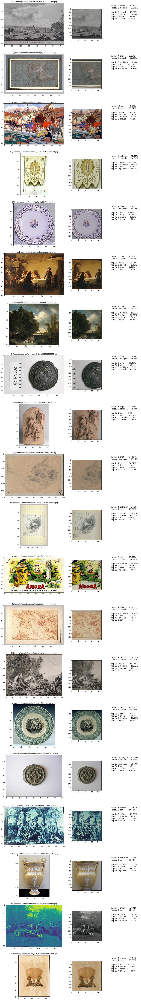

In [15]:
miss_classified = torch.cat((torch.LongTensor([x for x in np.arange(classified.shape[0])]).unsqueeze(1) , classified) , 1)

miss_classified = miss_classified[miss_classified[:,1] != miss_classified[:,2]][:,0]

random_pick = np.random.randint(0, len(miss_classified)-1, size=20)
#random_pick = np.arange(20)
print(random_pick)

testset_idx_pick = miss_classified[random_pick].numpy()
print(testset_idx_pick)

print('MISSCLASSIFIED IMAGES')

visualize_classification_from_tensor(test_set, classified, testset_idx_pick, top_k=5)


## Output to csv file

In [14]:
df = pd.DataFrame(columns= ['reference' , 'imageFile', 'image', 'target', 'prediction'])

df.imageFile = [test_set.samples[i][0].replace('/', '\\') for i in testset_idx_pick]
df.reference = df.imageFile.apply(lambda x:   os.path.splitext(os.path.basename(x))[0])
df.target =     [get_target_annotation(i, classified, test_set.classes, include_class_index=False) for i in testset_idx_pick]
df.prediction = [get_prediction_annotation(i, classified, test_set.classes, include_class_index=False) for i in testset_idx_pick]

df.to_csv('samples.csv', encoding='utf8')
df


,reference,imageFile,image,target,prediction
0,000PE002634,C:\\Joconde\\joconde\\animal\test\colombe\000P...,NaN,target: colombe 15.56%,pred: aigle 40.02%\n\t\t\t\t\t top-2:...
1,05120011828,C:\\Joconde\\joconde\\animal\test\colombe\0512...,NaN,target: colombe 6.02%,pred: ophidien 20.67%\n\t\t\t\t\t top-2:...
2,00000100131,C:\\Joconde\\joconde\\animal\test\chèvre\00000...,NaN,target: chèvre 7.72%,pred: ophidien 29.97%\n\t\t\t\t\t top-2:...
3,M0805001015,C:\\Joconde\\joconde\\animal\test\colombe\M080...,NaN,target: colombe 0.09%,pred: lion 42.16%\n\t\t\t\t\t top-2:...
4,07840003046,C:\\Joconde\\joconde\\animal\test\vache\078400...,NaN,target: vache 10.84%,pred: âne 44.70%\n\t\t\t\t\t top-2:...
5,00000075394,C:\\Joconde\\joconde\\animal\test\colombe\0000...,NaN,target: colombe 0.12%,pred: chat 99.28%\n\t\t\t\t\t top-2:...
6,50120002115,C:\\Joconde\\joconde\\animal\test\cheval\50120...,NaN,target: cheval 9.74%,pred: âne 16.96%\n\t\t\t\t\t top-2:...
7,000PE018810,C:\\Joconde\\joconde\\animal\test\âne\000PE018...,NaN,target: âne 9.69%,pred: mouton 37.19%\n\t\t\t\t\t top-2:...
8,07030000534,C:\\Joconde\\joconde\\animal\test\colombe\0703...,NaN,target: colombe 2.12%,pred: lion 77.10%\n\t\t\t\t\t top-2:...
9,M5037011198,C:\\Joconde\\joconde\\animal\test\aigle\M50370...,NaN,target: aigle 8.76%,pred: lion 27.50%\n\t\t\t\t\t top-2:...


In [11]:
def visualize_classification_from_tensor(test_set, classification_tensor, index_pick, top_k=5):

    rows = index_pick.shape[0]
    
    plt.tight_layout()
    fig, axes = plt.subplots(nrows=rows, ncols=3,  gridspec_kw = {'width_ratios':[2, 1, 1]})
    fig.set_size_inches(18.5, 7 * rows)
    
    #class_offset = 0
    #prob_offset = top_k + 1

   
    for i in range(rows):
        testset_idx = index_pick[i]

        image, target = test_set[testset_idx] # get a random missclassified image
        
        target_annotation = get_target_annotation(testset_idx,
                                                  classification_tensor,
                                                  test_set.classes,
                                                  class_offset = 0,
                                                  prob_offset=top_k + 1)

        prediction_annotation = get_prediction_annotation(testset_idx,
                                                          classification_tensor,
                                                          test_set.classes,
                                                          class_offset = 1,
                                                          prob_offset=top_k+2,
                                                          top_k=top_k).replace('\t\t\t\t\t', '\n', 1).replace('\t\t\t\t\t', '')


        axes[i, 0].imshow(mpimg.imread(test_set.samples[testset_idx][0]))
        axes[i, 0].set_title(test_set.samples[testset_idx][0])
        axes[i, 1].imshow( MonaLIA.image_tensor_to_np(image , [ 0.485, 0.456, 0.406 ], [ 0.229, 0.224, 0.225 ])  )


       # axes[i,1].annotate(annotation, fontsize=14, xy=(150, 0),
       #         xycoords='data', xytext=(0, 0),
       #         textcoords='offset points')


        axes[i,2].text(0.05, 0.95, target_annotation + '\n' + prediction_annotation, fontsize=14, verticalalignment='top')
        axes[i,2].axis('off')
        axes[i,2].autoscale(False)

    plt.show()

In [10]:
def get_target_annotation(testset_idx , classification_tensor , classes_str, class_offset= 0, prob_offset= 6, include_class_index=True):
 
    output = ( classification_tensor[testset_idx, class_offset]  ,
               classes_str[classification_tensor[testset_idx, class_offset]], 
               classification_tensor[testset_idx, prob_offset].float() / 100 )
    if(include_class_index):
        annotation = ('target: %2d %-12s %.2f%%' % output)
    else:
        annotation = ('target: %-12s %.2f%%' % output[1:])

    return annotation

def get_prediction_annotation(testset_idx , classification_tensor , classes_str, top_k = 5, class_offset= 1, prob_offset= 7, include_class_index=True):
    output = () 

    labels = ('  pred: %2d %-12s %.2f%%',
            ' top-2: %2d %-12s %.2f%%',
            ' top-3: %2d %-12s %.2f%%',
            ' top-4: %2d %-12s %.2f%%',
            ' top-5: %2d %-12s %.2f%%')
    
    for j in range(top_k):
        values = ( classification_tensor[testset_idx, class_offset + j]  ,
                   classes_str[classification_tensor[testset_idx, class_offset + j]], 
                   classification_tensor[testset_idx, prob_offset + j].float() / 100 )
        
        if(include_class_index):
            output = output + ((labels[j] % values),)
        
        else:
            output = output + ((labels[j].replace('%2d ', '') % values[1:]),)
    
    annotation =  ( '\n\t\t\t\t\t'.join(output))
    return annotation

### Visualize Correct Classification

[296 182 177  57 129 330  38 224  72 260 247 288 161 185 316 327 114 240
 154 120]
[768 505 486 146 356 831 114 639 186 696 676 757 447 509 801 821 273 669
 431 284]
WELL CLASSIFIED IMAGES


<Figure size 432x288 with 0 Axes>

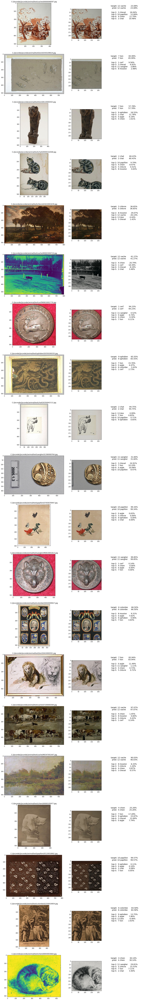

In [16]:
well_classified = torch.cat((torch.LongTensor([x for x in np.arange(classified.shape[0])]).unsqueeze(1) , classified) , 1)

well_classified = well_classified[well_classified[:,1] == well_classified[:,2]][:,0]

random_pick = np.random.randint(0, len(well_classified)-1, size=20)
#random_pick = np.arange(20)
print(random_pick)

testset_idx_pick = well_classified[random_pick].numpy()
print(testset_idx_pick)

print('WELL CLASSIFIED IMAGES')

visualize_classification_from_tensor(test_set, classified, testset_idx_pick)


In [252]:
df = pd.DataFrame(columns= ['reference' , 'imageFile', 'image', 'target', 'prediction'])

df.imageFile = [test_set.samples[i][0].replace('/', '\\') for i in testset_idx_pick]
df.reference = df.imageFile.apply(lambda x:   os.path.splitext(os.path.basename(x))[0])
df.target =     [get_target_annotation(i, classified, test_set.classes,  include_class_index=False) for i in testset_idx_pick]
df.prediction = [get_prediction_annotation(i, classified, test_set.classes, include_class_index=False) for i in testset_idx_pick]

df.to_csv('samples.csv', encoding='utf8')
df


,reference,imageFile,image,target,prediction
0,50350026096,C:\Joconde\joconde\domaine par support de cons...,NaN,target: miniature 99.94%,pred: miniature 99.94%\n\t\t\t\t\t top-2:...
1,07140009577,C:\Joconde\joconde\domaine par support de cons...,NaN,target: imprimé 62.63%,pred: imprimé 62.63%\n\t\t\t\t\t top-2:...
2,M0332001976,C:\Joconde\joconde\domaine par support de cons...,NaN,target: sculpture 96.64%,pred: sculpture 96.64%\n\t\t\t\t\t top-2:...
3,50350107610,C:\Joconde\joconde\domaine par support de cons...,NaN,target: dessin 97.56%,pred: dessin 97.56%\n\t\t\t\t\t top-2:...
4,50350112569,C:\Joconde\joconde\domaine par support de cons...,NaN,target: dessin 49.53%,pred: dessin 49.53%\n\t\t\t\t\t top-2:...
5,50350020624,C:\Joconde\joconde\domaine par support de cons...,NaN,target: dessin 97.02%,pred: dessin 97.02%\n\t\t\t\t\t top-2:...
6,50350022155,C:\Joconde\joconde\domaine par support de cons...,NaN,target: miniature 99.10%,pred: miniature 99.10%\n\t\t\t\t\t top-2:...
7,50350019361,C:\Joconde\joconde\domaine par support de cons...,NaN,target: miniature 91.48%,pred: miniature 91.48%\n\t\t\t\t\t top-2:...
8,50350019286,C:\Joconde\joconde\domaine par support de cons...,NaN,target: miniature 89.93%,pred: miniature 89.93%\n\t\t\t\t\t top-2:...
9,000PE023300,C:\Joconde\joconde\domaine par support de cons...,NaN,target: peinture 73.73%,pred: peinture 73.73%\n\t\t\t\t\t top-2:...
